# Adaptive Filters

### Group
- Priyam Mazumdar (priyamm2@illinois.edu)
- Ridha Alkhabaz (ridhama2@illinois.edu)
- Ali Albazroun (aia@illinois.edu)



Adaptive Filters is a type of filter that can dynamically change its filter coefficient depending on the task of interest. As an overview, a filter's purpose is to supress different aspects of the signal. For example, a High Pass filter can identify noise or edges in data. The problem is, if the frequency of noise is changing in real time, a static filter is insufficient to do proper noise suppression. 

One of the intial usecases for Adaptive Filters were for [Echo Cancellation](https://scholar.uwindsor.ca/cgi/viewcontent.cgi?article=1828&context=etd). Another common usecase is for noise reduction for speech. We will be exploring some typical Adaptive Filtering techniques such as Least Mean Squares and Normalized Least Mean Squares. The benefits of these methods is they can be used in a real-time causal system. We will then relax some of these constraints and then apply some of the optimization methods we learned in class!


### What are Adaptive Filters?

Adaptive filters are a type of filter that can change based on the incoming and outgoing signal. This change is typically done through some type of optimization procedure, like least squared or gradient descent. Adaptive filters can typically be written as:

$$x_{t+1} = w_1 \cdot x_{t} + w_1 \cdot x_{t-1} + w_2 \cdot x_{t-2} + ... w_F \cdot x_{t-F} $$

Where F is the the filter size that we want for our adpative filter. To solve this, we can use iterative learning techniques, such as Least Mean Square and Normalized Least Mean Square to solve the changing filter coefficient over time. 

The matrix we typically set up for this is (if we have a filter size of 3):

$$ \begin{bmatrix}
x_0 & x_1 & x_2\\
x_1 & x_2 & x_3 \\
x_2 & x_3 & x_4 \\
\vdots & \vdots & \vdots\\
x_{N-3} & x_{N-2} & x_{N-1} \\
\end{bmatrix} \cdot 
\begin{bmatrix}
w_1 \\
w_2  \\
w_3 \\
\end{bmatrix} = 
\begin{bmatrix}
x_3 \\
x_4  \\
x_5 \\
\vdots \\
x_N
\end{bmatrix}
$$


### Adaptive Filters for Denoising
First step, we will grab some audio and then add noise to it! We are using a sample from LibriSpeech.

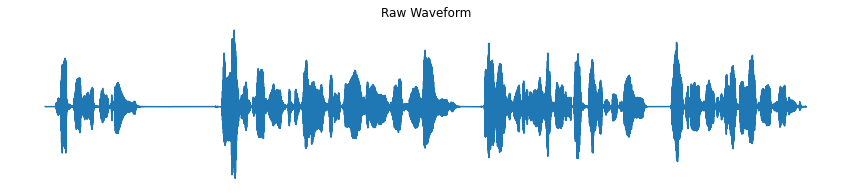

In [2]:
import numpy as np
import padasip as pa
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import scipy
import IPython
import librosa
import xgboost
from xgboost import XGBRegressor

raw_audio, sr = librosa.load("audio.wav", sr=16000)

plt.figure(figsize=(15,3))
plt.plot(raw_audio)
plt.axis("off")
plt.title("Raw Waveform")
plt.show()

### Adding Noise

For our tests, we will be exploring adding simple Gaussian noise throughout the entire audio, as well as a more difficult scenario where the amount of noise changes with some sinusoidal pattern to see if the different models can handle a more dynamic noise pattern. 

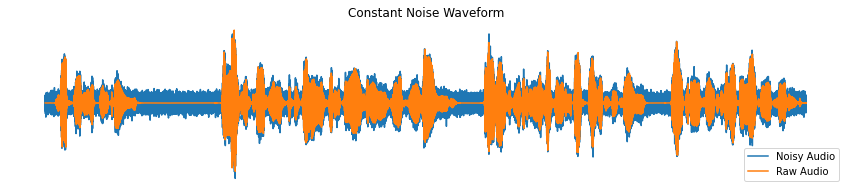

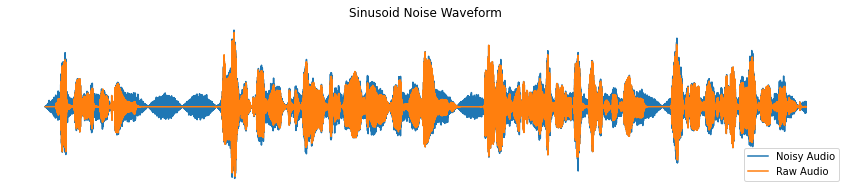

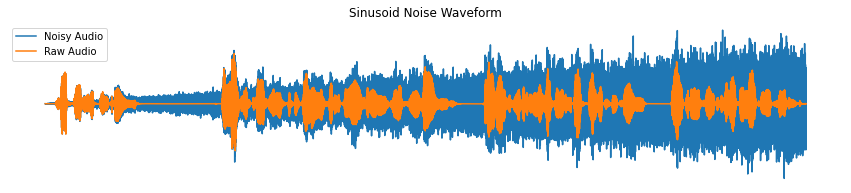

In [3]:
class AddNoise:
    def constant_noise(x, mu=0, sigma=0.03):
        noise = np.random.normal(loc=mu, scale=sigma, size=(len(x)))
        x = x + noise
        return x

    def sinusoidal_noise(x, mu=0, sigma=0.3, sin_freq=0.0003, amplitude=0.1):
        noise = np.random.normal(loc=mu, scale=sigma, size=(len(x)))
        sin = amplitude*np.sin(sin_freq*np.arange(len(x)))
        sinusoid_noise = noise * sin
        x = x + sinusoid_noise
        return x

    def funnel_noise(x, start=0, end=0.2):
        noise = np.random.normal(size=(len(x)))
        funnel = np.linspace(start,end,len(x))
        funnel_noise = noise*funnel
        x = x + funnel_noise
        return x

### Constant Noise ###
constant_noisy = AddNoise.constant_noise(raw_audio)

plt.figure(figsize=(15,3))
plt.plot(constant_noisy, label="Noisy Audio")
plt.plot(raw_audio, label="Raw Audio")
plt.axis("off")
plt.title("Constant Noise Waveform")
plt.legend()
plt.show()


### Sinusoid Noise ###
sinusoid_noisy = AddNoise.sinusoidal_noise(raw_audio)

plt.figure(figsize=(15,3))
plt.plot(sinusoid_noisy, label="Noisy Audio")
plt.plot(raw_audio, label="Raw Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

### Funnel Noise ###
funnel_noisy = AddNoise.funnel_noise(raw_audio)

plt.figure(figsize=(15,3))
plt.plot(funnel_noisy, label="Noisy Audio")
plt.plot(raw_audio, label="Raw Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

### WADA Metric

Waveform Amplitude Distribution Analysis ([WADA](https://www.cs.cmu.edu/~robust/Papers/KimSternIS08.pdf)) is a benchmark proposed for SNR measurement in human speech. The assumption made by this algorithm is the SNR of an audio can be approximated via a gaussian distribution with shaping parameter 0.4. This method seems to be much more robust and less effected by bias compared to other SNR metrics, so we will be utilizing this to compare how different models are performing!

We will also be using the implementation of the WADA metric from the authors as shown below. 


In [4]:
def wada_snr(wav):
    # Direct blind estimation of the SNR of a speech signal.
    #
    # Paper on WADA SNR:
    #   http://www.cs.cmu.edu/~robust/Papers/KimSternIS08.pdf
    #
    # This function was adapted from this matlab code:
    #   https://labrosa.ee.columbia.edu/projects/snreval/#9

    # init
    eps = 1e-10
    # next 2 lines define a fancy curve derived from a gamma distribution -- see paper
    db_vals = np.arange(-20, 101)
    g_vals = np.array([0.40974774, 0.40986926, 0.40998566, 0.40969089, 0.40986186, 0.40999006, 0.41027138,
                       0.41052627, 0.41101024, 0.41143264, 0.41231718, 0.41337272, 0.41526426, 0.4178192,
                       0.42077252, 0.42452799, 0.42918886, 0.43510373, 0.44234195, 0.45161485, 0.46221153,
                       0.47491647, 0.48883809, 0.50509236, 0.52353709, 0.54372088, 0.56532427, 0.58847532,
                       0.61346212, 0.63954496, 0.66750818, 0.69583724, 0.72454762, 0.75414799, 0.78323148, 
                       0.81240985, 0.84219775, 0.87166406, 0.90030504, 0.92880418, 0.95655449, 0.9835349,
                       1.01047155, 1.0362095 , 1.06136425, 1.08579312, 1.1094819 , 1.13277995, 1.15472826, 
                       1.17627308, 1.19703503, 1.21671694, 1.23535898, 1.25364313, 1.27103891, 1.28718029, 
                       1.30302865, 1.31839527, 1.33294817, 1.34700935, 1.3605727 , 1.37345513, 1.38577122,
                       1.39733504, 1.40856397, 1.41959619, 1.42983624, 1.43958467, 1.44902176, 1.45804831,
                       1.46669568, 1.47486938, 1.48269965, 1.49034339, 1.49748214, 1.50435106, 1.51076426,
                       1.51698915, 1.5229097 , 1.528578  , 1.53389835, 1.5391211 , 1.5439065 , 1.54858517, 
                       1.55310776, 1.55744391, 1.56164927, 1.56566348, 1.56938671, 1.57307767, 1.57654764,
                       1.57980083, 1.58304129, 1.58602496, 1.58880681, 1.59162477, 1.5941969 , 1.59693155, 
                       1.599446  , 1.60185011, 1.60408668, 1.60627134, 1.60826199, 1.61004547, 1.61192472,
                       1.61369656, 1.61534074, 1.61688905, 1.61838916, 1.61985374, 1.62135878, 1.62268119,
                       1.62390423, 1.62513143, 1.62632463, 1.6274027 , 1.62842767, 1.62945532, 1.6303307,
                       1.63128026, 1.63204102])

    # peak normalize, get magnitude, clip lower bound
    wav = np.array(wav)
    wav = wav / abs(wav).max()
    abs_wav = abs(wav)
    abs_wav[abs_wav < eps] = eps

    # calcuate statistics
    # E[|z|]
    v1 = max(eps, abs_wav.mean())
    # E[log|z|]
    v2 = np.log(abs_wav).mean()
    # log(E[|z|]) - E[log(|z|)]
    v3 = np.log(v1) - v2

    # table interpolation
    wav_snr_idx = None
    if any(g_vals < v3):
        wav_snr_idx = np.where(g_vals < v3)[0].max()
    # handle edge cases or interpolate
    if wav_snr_idx is None:
        wav_snr = db_vals[0]
    elif wav_snr_idx == len(db_vals) - 1:
        wav_snr = db_vals[-1]
    else:
        wav_snr = db_vals[wav_snr_idx] + \
            (v3-g_vals[wav_snr_idx]) / (g_vals[wav_snr_idx+1] - \
            g_vals[wav_snr_idx]) * (db_vals[wav_snr_idx+1] - db_vals[wav_snr_idx])

    # Calculate SNR
    dEng = sum(wav**2)
    dFactor = 10**(wav_snr / 10)
    dNoiseEng = dEng / (1 + dFactor) # Noise energy
    dSigEng = dEng * dFactor / (1 + dFactor) # Signal energy
    snr = 10 * np.log10(dSigEng / dNoiseEng)

    return snr

### Testing the WADA Metric

Lets compute our WADA metric on the raw (clean audio) as well as our two noisy audios. 

In [5]:
raw_wada = wada_snr(raw_audio)
constant_wada = wada_snr(constant_noisy)
sin_wada = wada_snr(sinusoid_noisy)
funnel_wada = wada_snr(funnel_noisy)

print("Raw Audio SNR:", raw_wada)
print("Constant Noise SNR:", constant_wada)
print("Sinusoid Noise SNR:", sin_wada)
print("Funnel Noise SNR:", funnel_wada)

Raw Audio SNR: 100.0
Constant Noise SNR: 5.720611410665029
Sinusoid Noise SNR: 12.236861634857728
Funnel Noise SNR: 9.003757646895304


As we can see, our Raw Audio had the highest score (perfect out of 100) for being a high quality and noise free audio sample! Sinusoid has the next highest (although significantly lower) SNR value, and Constant Gaussian Noise has the lowest SNR. This makes sense as our amount of noise in the Sinuois is changing over time, so it will have a lower noise amount overall through the whole audio. 

### LMS Adaptive Filter

Least Mean Square adaptive filters has a very simple iterative update rule for the weights. We can compute our prediction via a dot product between our weights and a slice of our sequence, and then compute the error between the true sequence and our prediction to update weights. 

**Update Rule**
$$w = w + \mu*errors*x$$

where $errors=y_{true} - y_{pred}$ and $\mu$ is our learning rate.


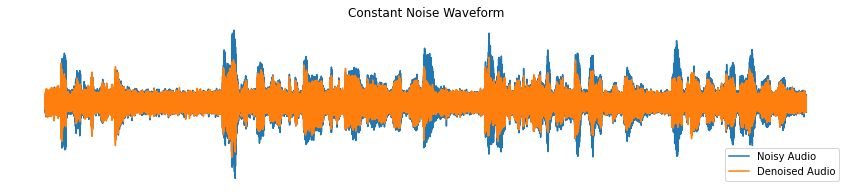

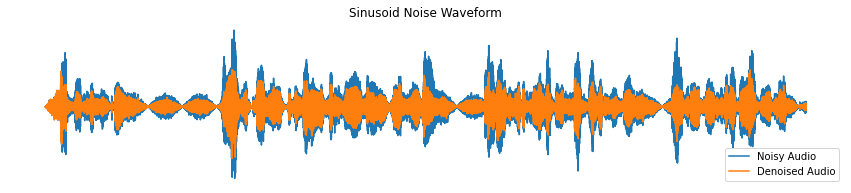

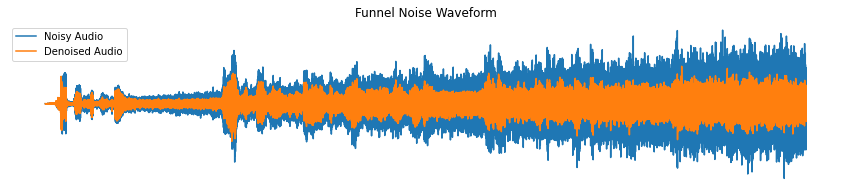

Constant Noise SNR: 3.106871363506639
Sinusoid Noise SNR: 11.926768024478594
Funnel Noise SNR: 7.944362103828188


In [6]:
def lms(audio, clean_audio, filter_taps=4, mu=0.1):

    ### Create AutoRegressive Matrix ###
    X = pa.input_from_history(audio,filter_taps)[:-1]
    d = clean_audio[filter_taps:]
    w = np.random.rand(filter_taps)

    w_store = np.zeros((len(X), filter_taps))
    y_pred = np.zeros(len(X))
    errors = np.zeros(len(X))
    
    for i in range(len(X)):
        w_store[i] = w
        y_pred[i] = np.dot(w, X[i])
        errors[i] = d[i] - y_pred[i]
        w += (mu*errors[i]*audio[i])

    return y_pred

lms_constant_denoise = lms(constant_noisy, raw_audio)
lms_sinusoid_denoise = lms(sinusoid_noisy, raw_audio)
lms_funnel_denoise = lms(funnel_noisy, raw_audio)

### Constant Noise ###
plt.figure(figsize=(15,3))
plt.plot(constant_noisy, label="Noisy Audio")
plt.plot(lms_constant_denoise, label="Denoised Audio")
plt.axis("off")
plt.title("Constant Noise Waveform")
plt.legend()
plt.show()


### Sinusoid Noise ###
plt.figure(figsize=(15,3))
plt.plot(sinusoid_noisy, label="Noisy Audio")
plt.plot(lms_sinusoid_denoise, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()


### Funnel Noise ###
plt.figure(figsize=(15,3))
plt.plot(funnel_noisy, label="Noisy Audio")
plt.plot(lms_funnel_denoise, label="Denoised Audio")
plt.axis("off")
plt.title("Funnel Noise Waveform")
plt.legend()
plt.show()

print("Constant Noise SNR:", wada_snr(lms_constant_denoise))
print("Sinusoid Noise SNR:", wada_snr(lms_sinusoid_denoise))
print("Funnel Noise SNR:", wada_snr(lms_funnel_denoise))

### Normalized LMS Adaptive Filter

Normalized Least Mean Square adaptive filters improve upon LMS by normalizing the learning rate by the magnitude of our input vector. By doing so, when large changes occur, the shifts in filter coefficients can be more reactive and smooth. 

**Update Rule**

$$\mu = \frac{\mu}{||x||^2_2}$$

$$w = w + \mu*errors*x$$

where $errors=y_{true} - y_{pred}$


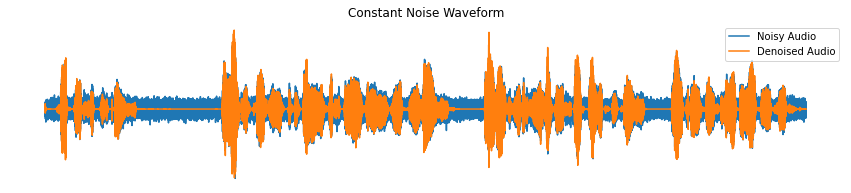

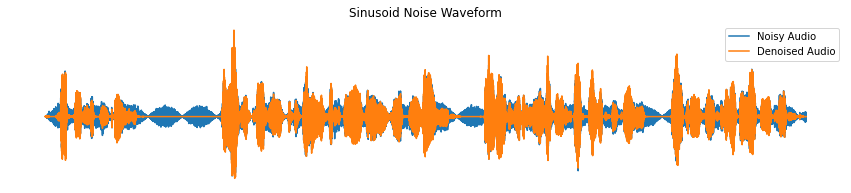

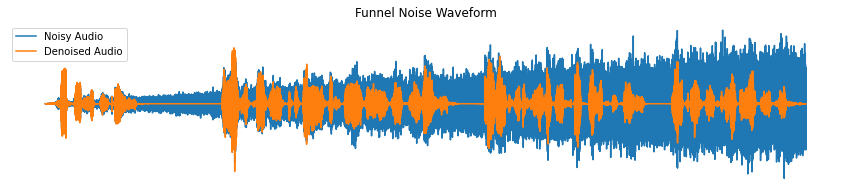

Constant Noise SNR: 100.0
Sinusoid Noise SNR: 100.0
Funnel Noise SNR: 100.0


In [7]:
def nlms(audio, clean_audio, filter_taps=4, mu=0.1):

    ### Create AutoRegressive Matrix ###
    X = pa.input_from_history(audio,filter_taps)[:-1]
    d = clean_audio[filter_taps:]
    w = np.random.rand(filter_taps)
    
    w_store = np.zeros((len(X), filter_taps))
    y_pred = np.zeros(len(X))
    errors = np.zeros(len(X))

    
    for i in range(len(X)):
        w_store[i] = w
        y_pred[i] = np.dot(w, X[i])
        errors[i] = d[i] - y_pred[i]
        w += mu / (0.001 + np.dot(X[i], X[i])) * X[i] * errors[i]

    return y_pred

nlms_constant_denoise = nlms(constant_noisy, raw_audio)
nlms_sinusoid_denoise = nlms(sinusoid_noisy, raw_audio)
nlms_funnel_denoise = nlms(funnel_noisy, raw_audio)

### Constant Noise ###
plt.figure(figsize=(15,3))
plt.plot(constant_noisy, label="Noisy Audio")
plt.plot(nlms_constant_denoise, label="Denoised Audio")
plt.axis("off")
plt.title("Constant Noise Waveform")
plt.legend()
plt.show()


### Sinusoid Noise ###
plt.figure(figsize=(15,3))
plt.plot(sinusoid_noisy, label="Noisy Audio")
plt.plot(nlms_sinusoid_denoise, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()


### Funnel Noise ###
plt.figure(figsize=(15,3))
plt.plot(funnel_noisy, label="Noisy Audio")
plt.plot(nlms_funnel_denoise, label="Denoised Audio")
plt.axis("off")
plt.title("Funnel Noise Waveform")
plt.legend()
plt.show()

print("Constant Noise SNR:", wada_snr(nlms_constant_denoise))
print("Sinusoid Noise SNR:", wada_snr(nlms_sinusoid_denoise))
print("Funnel Noise SNR:", wada_snr(nlms_funnel_denoise))

### Lets listen to the Outputs!

In [8]:
print("Raw Audio File")
display(IPython.display.Audio(raw_audio, rate=16000))

print("Constant Noisy Audio")
display(IPython.display.Audio(constant_noisy, rate=16000))

print("Sinusoid Noisy Audio")
display(IPython.display.Audio(sinusoid_noisy, rate=16000))

print("Funnel Noisey Audio")
display(IPython.display.Audio(funnel_noisy, rate=16000))

print("LMS Constant Denoised")
display(IPython.display.Audio(lms_constant_denoise, rate=16000))

print("LMS Sinusoid Denoised")
display(IPython.display.Audio(lms_sinusoid_denoise, rate=16000))

print("LMS Funnel Denoised")
display(IPython.display.Audio(lms_funnel_denoise, rate=16000))

print("NLMS Constant Denoised")
display(IPython.display.Audio(nlms_constant_denoise, rate=16000))

print("NLMS Sinusoid Denoised")
display(IPython.display.Audio(nlms_sinusoid_denoise, rate=16000))

print("NLMS Funnel Denoised")
display(IPython.display.Audio(nlms_funnel_denoise, rate=16000))



Raw Audio File


Constant Noisy Audio


Sinusoid Noisy Audio


Funnel Noisey Audio


LMS Constant Denoised


LMS Sinusoid Denoised


LMS Funnel Denoised


NLMS Constant Denoised


NLMS Sinusoid Denoised


NLMS Funnel Denoised


So listening to this, the WADA score is actually deceptive. I think the WADA score is supposed to be used for more constant background noise. The problem with an adaptive filter is, the weights are changing across time. This means, when new noise appears (especially in the sinusoidal noise) it can take a few frames to actually adjust the filter weights to remove this new noise! 

LMS was unable to recover any good results and the noise was more muffled than removed. NLMS was able to remove the noise, but we hear a very obvious deterioration of the audio quality, effectively chunks of noise remaining as the adaptive filter can't update fast enough. 

## Effect of Filter Taps

We were also curious to see if the number of filter taps had any tangible effect on our results. Lets apply it to our Sinusoidal noise!


Results with 1 Filter Taps


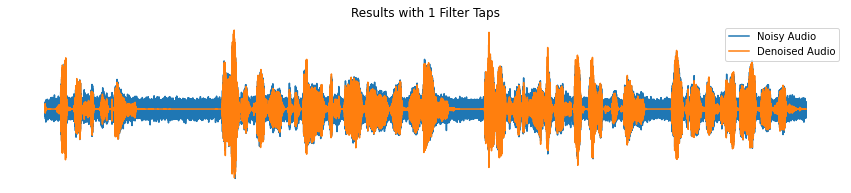

Results with 4 Filter Taps


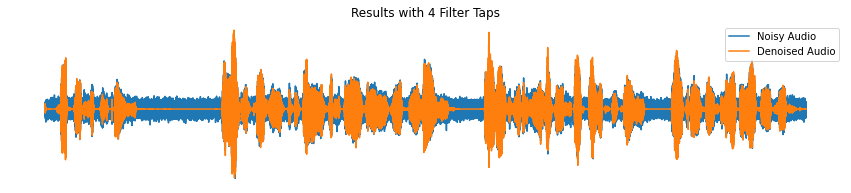

Results with 16 Filter Taps


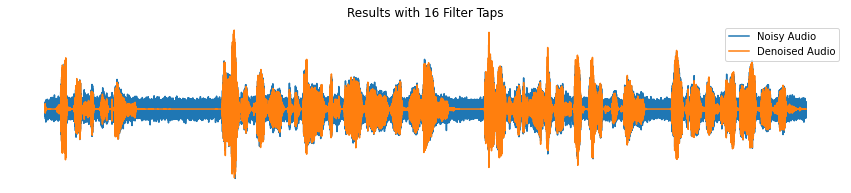

Results with 64 Filter Taps


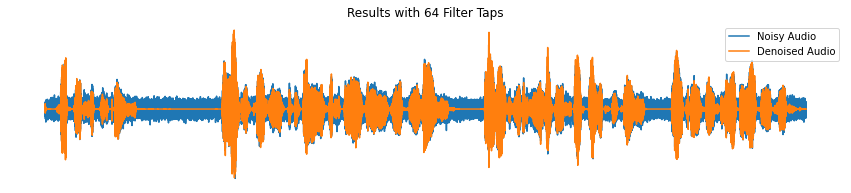

Results with 256 Filter Taps


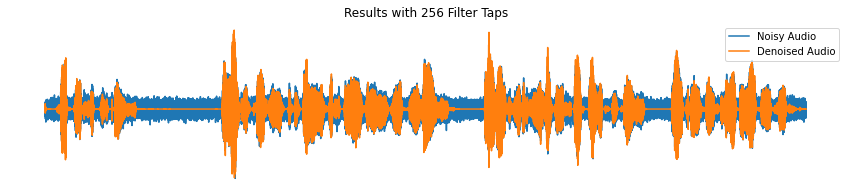

Results with 1024 Filter Taps


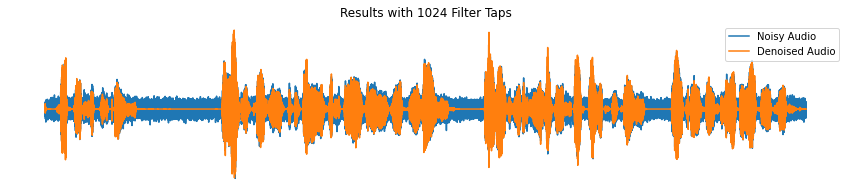

In [9]:
for taps in [1,4,16,64,256,1024]:
    print(f"Results with {taps} Filter Taps")
    nlms_sinusoid_denoise = nlms(sinusoid_noisy, raw_audio, filter_taps=taps)

    ### Constant Noise ###
    plt.figure(figsize=(15,3))
    plt.plot(constant_noisy, label="Noisy Audio")
    plt.plot(nlms_constant_denoise, label="Denoised Audio")
    plt.axis("off")
    plt.title(f"Results with {taps} Filter Taps")
    plt.legend()
    plt.show()

    display(IPython.display.Audio(nlms_sinusoid_denoise, rate=16000))


We can clearly hear increasing the number of filter taps does improve our audio quality a bit, but going to far leads to an almost muffled and echoed effect!

### Batched Optimization

If we relax our causality assumption a bit, and assume that we can buffer some audio so we have some "foresight" in our filtering, we can actually try to improve upon this, so our filtering is no longer lagged. 


In this case, we will be taking our audio and cutting up into the size of our filter taps. If we have N filter taps, we then can grab N consecutive samples and solve the autogregressive regression problem. We will then apply this filter coefficient to the first chunk to create our first prediction 

  0%|          | 0/232464 [00:00<?, ?it/s]

  0%|          | 0/232464 [00:00<?, ?it/s]

  0%|          | 0/232464 [00:00<?, ?it/s]

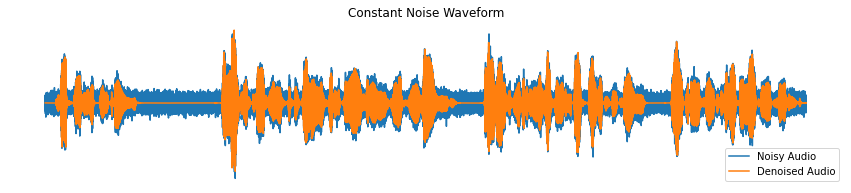

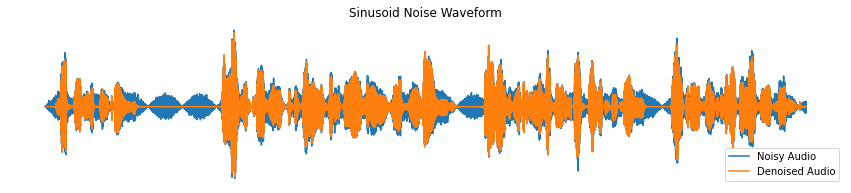

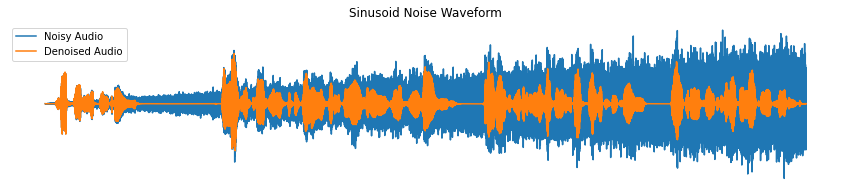

Constant Noise SNR: 100.0
Sinusoid Noise SNR: 100.0
Funnel Noise SNR: 100.0


In [10]:
def batched_lstq_filter(audio, clean_audio, filter_taps=8):

    ### Cut Signal Into AutoRegressive Matrix ###
    signal_slices = []
    predictions = []
    
    i = 0
    while True:
        signal_slice = audio[i:i+filter_taps]
        signal_slices.append(signal_slice)
        prediction = clean_audio[i+filter_taps]
        predictions.append(prediction)
    
        i+=1
        if (i + filter_taps) >= len(clean_audio):
            break

    i = 0
    ### Grab Filter Taps of chunks every Iteration and Solve Ax=b for Coeffs ###
    
    weights = []

    pbar = tqdm(total=len(signal_slices))
    while True:
        chunks = signal_slices[i:i+filter_taps]
        preds = predictions[i:i+filter_taps]
    
        chunks = np.concatenate(chunks).reshape(filter_taps, filter_taps)
        preds = np.array(preds).reshape(-1,1)
    
        filter_coeffs, *_ = np.linalg.lstsq(chunks, preds, rcond=-1)
        filter_coeffs = filter_coeffs.reshape(-1)

        weights.append(filter_coeffs)
        
        i += 1
        pbar.update(1)
        if (i + filter_taps) >= len(signal_slices):
            break

    predicted_audio = []
    for w, c in zip(weights, signal_slices):
        predicted_audio.append(np.dot(w,c))
 
    return np.array(predicted_audio)


batched_constant_denoised = batched_lstq_filter(constant_noisy, raw_audio, 16)
batched_sinusoid_denoised = batched_lstq_filter(sinusoid_noisy, raw_audio, 16)
batched_funnel_denoised = batched_lstq_filter(funnel_noisy, raw_audio, 16)

## Constant Noise ###
plt.figure(figsize=(15,3))
plt.plot(constant_noisy, label="Noisy Audio")
plt.plot(batched_constant_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Constant Noise Waveform")
plt.legend()
plt.show()

### Sinusoid Noise ###
plt.figure(figsize=(15,3))
plt.plot(sinusoid_noisy, label="Noisy Audio")
plt.plot(batched_sinusoid_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

### Funnel Noise ###
plt.figure(figsize=(15,3))
plt.plot(funnel_noisy, label="Noisy Audio")
plt.plot(batched_funnel_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

print("Constant Noise SNR:", wada_snr(batched_constant_denoised))
print("Sinusoid Noise SNR:", wada_snr(batched_sinusoid_denoised))
print("Funnel Noise SNR:", wada_snr(batched_sinusoid_denoised))


### Lets Listen to the Audio!

In [16]:
print("Batched LSTQ Constant Denoised")
display(IPython.display.Audio(batched_constant_denoised, rate=16000))

print("Batched LSTQ Sinusoid Denoised")
display(IPython.display.Audio(batched_sinusoid_denoised, rate=16000))

print("Batched LSTQ Funnel Denoised")
display(IPython.display.Audio(batched_funnel_denoised, rate=16000))



Batched LSTQ Constant Denoised


Batched LSTQ Sinusoid Denoised


Batched LSTQ Funnel Denoised


Definitely a huge improvement! Although we gave up causality a bit, the benefits of the output far outweigh that slight computational overhead of storing a buffer! To be honest, we didn't think that Least squares would solve this so well! Either way, we can try some other solvers to see if they work as well. 

  0%|          | 0/232464 [00:00<?, ?it/s]

  0%|          | 0/232464 [00:00<?, ?it/s]

  0%|          | 0/232464 [00:00<?, ?it/s]

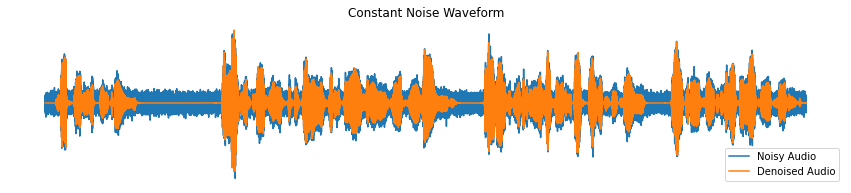

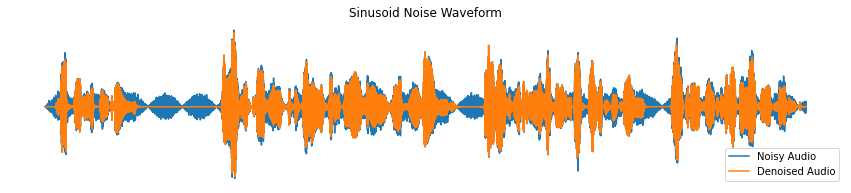

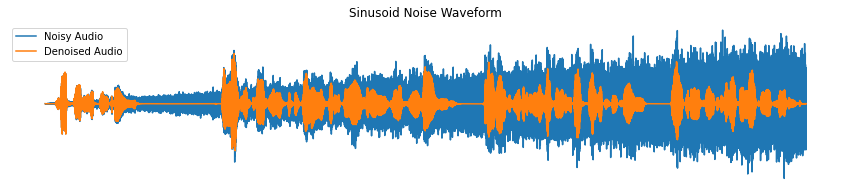

Constant Noise SNR: 100.0
Sinusoid Noise SNR: 100.0
Funnel Noise SNR: 100.0


In [17]:
def batched_cg_filter(audio, clean_audio, filter_taps=8):

    ### Cut Signal Into AutoRegressive Matrix ###
    signal_slices = []
    predictions = []
    
    i = 0
    while True:
        signal_slice = audio[i:i+filter_taps]
        signal_slices.append(signal_slice)
        prediction = clean_audio[i+filter_taps]
        predictions.append(prediction)
    
        i+=1
        if (i + filter_taps) >= len(clean_audio):
            break

    i = 0
    ### Grab Filter Taps of chunks every Iteration and Solve Ax=b for Coeffs ###
    weights = []

    pbar = tqdm(total=len(signal_slices))
    while True:
        chunks = signal_slices[i:i+filter_taps]
        preds = predictions[i:i+filter_taps]
    
        chunks = np.concatenate(chunks).reshape(filter_taps, filter_taps)
        preds = np.array(preds).reshape(-1,1)
    
        filter_coeffs, *_ = scipy.sparse.linalg.cg(chunks, preds)
        filter_coeffs = filter_coeffs.reshape(-1)

        weights.append(filter_coeffs)
        
        i += 1
        pbar.update(1)
        if (i + filter_taps) >= len(signal_slices):
            break

    predicted_audio = []
    for w, c in zip(weights, signal_slices):
        predicted_audio.append(np.dot(w,c))
 
    return np.array(predicted_audio)

batched_cg_constant_denoised = batched_cg_filter(constant_noisy, raw_audio, 16)
batched_cg_sinusoid_denoised = batched_cg_filter(sinusoid_noisy, raw_audio, 16)
batched_cg_funnel_denoised = batched_cg_filter(funnel_noisy, raw_audio, 16)

## Constant Noise ###
plt.figure(figsize=(15,3))
plt.plot(constant_noisy, label="Noisy Audio")
plt.plot(batched_cg_constant_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Constant Noise Waveform")
plt.legend()
plt.show()

### Sinusoid Noise ###
plt.figure(figsize=(15,3))
plt.plot(sinusoid_noisy, label="Noisy Audio")
plt.plot(batched_cg_sinusoid_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

### Funnel Noise ###
plt.figure(figsize=(15,3))
plt.plot(funnel_noisy, label="Noisy Audio")
plt.plot(batched_cg_funnel_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

print("Constant Noise SNR:", wada_snr(batched_constant_denoised))
print("Sinusoid Noise SNR:", wada_snr(batched_sinusoid_denoised))
print("Funnel Noise SNR:", wada_snr(batched_sinusoid_denoised))


In [18]:
print("Batched LSTQ Constant Denoised")
display(IPython.display.Audio(batched_cg_constant_denoised, rate=16000))

print("Batched LSTQ Sinusoid Denoised")
display(IPython.display.Audio(batched_cg_sinusoid_denoised, rate=16000))

print("Batched LSTQ Funnel Denoised")
display(IPython.display.Audio(batched_cg_funnel_denoised, rate=16000))



Batched LSTQ Constant Denoised


Batched LSTQ Sinusoid Denoised


Batched LSTQ Funnel Denoised


## XGBoost

We can also give a more traditional ML model a try! What we will do is take our inputs and predictions, and then do a typical ML pipline to create a predicive model. 

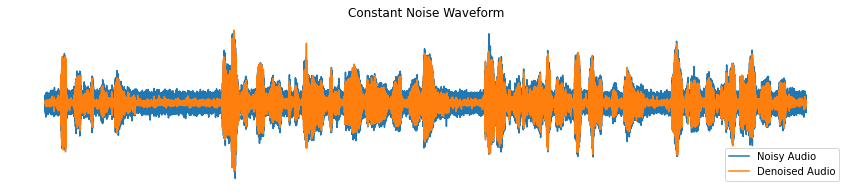

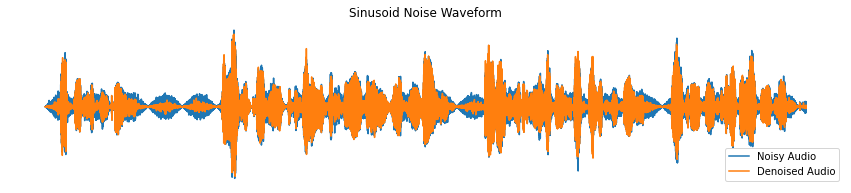

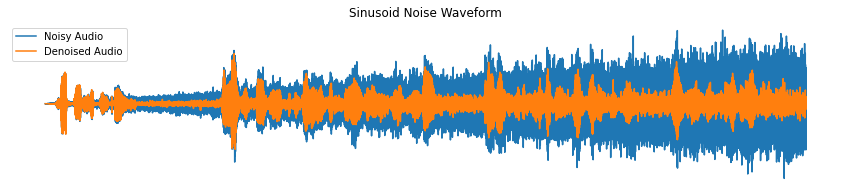

In [14]:
def xgboost_denoising(audio, clean_audio, filter_taps=8):
    ### Cut Signal Into AutoRegressive Matrix ###
    signal_slices = []
    predictions = []
    
    i = 0
    while True:
        signal_slice = audio[i:i+filter_taps]
        signal_slices.append(signal_slice)
        prediction = clean_audio[i+filter_taps]
        predictions.append(prediction)
    
        i+=1
        if (i + filter_taps) >= len(clean_audio):
            break

    X = np.array(signal_slices)
    y = np.array(predictions)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.4)

    model = XGBRegressor(n_estimators=200, max_depth=15)

    model.fit(X_train, y_train)

    predictions = model.predict(X)

    return predictions

xgboost_constant_denoised = xgboost_denoising(constant_noisy, raw_audio, 16)
xgboost_sinusoid_denoised = xgboost_denoising(sinusoid_noisy, raw_audio, 16)
xgboost_funnel_denoised = xgboost_denoising(funnel_noisy, raw_audio, 16)

## Constant Noise ###
plt.figure(figsize=(15,3))
plt.plot(constant_noisy, label="Noisy Audio")
plt.plot(xgboost_constant_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Constant Noise Waveform")
plt.legend()
plt.show()

### Sinusoid Noise ###
plt.figure(figsize=(15,3))
plt.plot(sinusoid_noisy, label="Noisy Audio")
plt.plot(xgboost_sinusoid_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()

### Funnel Noise ###
plt.figure(figsize=(15,3))
plt.plot(funnel_noisy, label="Noisy Audio")
plt.plot(xgboost_funnel_denoised, label="Denoised Audio")
plt.axis("off")
plt.title("Sinusoid Noise Waveform")
plt.legend()
plt.show()



In [15]:
print("XGBOOST Constant Denoised")
display(IPython.display.Audio(xgboost_constant_denoised, rate=16000))

print("XGBOOST Sinusoid Denoised")
display(IPython.display.Audio(xgboost_sinusoid_denoised, rate=16000))

print("XGBOOST Funnel Denoised")
display(IPython.display.Audio(xgboost_funnel_denoised, rate=16000))



XGBOOST Constant Denoised


XGBOOST Sinusoid Denoised


XGBOOST Funnel Denoised


This definitely doesn't sound nearly as good as previous but was an interesting experiment! There are other learning based methods we could actually try (specifically RNNs or architectures more built for denoising such as autoencoders) but those experiments have already shown to be really good by other work!